<a href="https://colab.research.google.com/github/KathituCodes/Climate-Change-in-Africa-Temperature-Weather-Analysis-1980-2023-/blob/main/Climate_change_in_Africa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Loading the Data

In [1]:
#Load the dataset into a data frame using Python.
import pandas as pd
data= pd.read_csv('/content/Africa_climate_change.csv')
data.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon


In [3]:
data.tail()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
464810,20230823 000000,NaN,85.0,89.0,NaN,Senegal
464811,20230823 000000,NaN,80.0,90.0,72.0,Egypt
464812,20230823 000000,NaN,87.0,NaN,73.0,Egypt
464813,20230823 000000,0.0,82.0,94.0,NaN,Senegal
464814,20230823 000000,NaN,83.0,NaN,NaN,Cameroon


# Exploring the Data



In [2]:
#Clean the data as needed
#checking the structure of the data first
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


The column names give a vague representation of the data in those columns so I will consider renaming them.
The date fomart is also in object type and needs to be changed.

In [5]:
data.describe(include ="all")

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
count,464815,177575.000000,458439.000000,363901.000000,332757.000000,464815
unique,15938,NaN,NaN,NaN,NaN,5
top,20150625 000000,NaN,NaN,NaN,NaN,Senegal
freq,37,NaN,NaN,NaN,NaN,183262
mean,NaN,0.120941,77.029838,88.713969,65.548262,NaN
std,NaN,0.486208,11.523634,13.042631,11.536547,NaN
min,NaN,0.000000,-49.000000,41.000000,12.000000,NaN
25%,NaN,0.000000,70.000000,81.000000,58.000000,NaN
50%,NaN,0.000000,80.000000,90.000000,68.000000,NaN
75%,NaN,0.010000,85.000000,99.000000,74.000000,NaN


The dataset shows that we have 5 unique countries of focus on climate change with Senegal being the country that appears the most.

# Changing Column Names

In [16]:
# Lets rename some columns
new_data = data.rename(columns= {'DATE': 'Date',
                          'PRCP': 'Precipitation',
                          'TAVG': 'Temperature AVG',
                          'TMAX': 'Temperature MAX',
                          'TMIN': 'Temperature MIN',
                          'COUNTRY': 'Country'
                          })

print(new_data)

                   Date  Precipitation  Temperature AVG  Temperature MAX  \
0       19800101 000000            NaN             54.0             61.0   
1       19800101 000000            NaN             49.0             55.0   
2       19800101 000000            0.0             72.0             86.0   
3       19800101 000000            NaN             50.0             55.0   
4       19800101 000000            NaN             75.0             91.0   
...                 ...            ...              ...              ...   
464810  20230823 000000            NaN             85.0             89.0   
464811  20230823 000000            NaN             80.0             90.0   
464812  20230823 000000            NaN             87.0              NaN   
464813  20230823 000000            0.0             82.0             94.0   
464814  20230823 000000            NaN             83.0              NaN   

        Temperature MIN   Country  
0                  43.0   Tunisia  
1              

In [17]:
# Let us load the head of our data to view the new column names
new_data.head()

,Date,Precipitation,Temperature AVG,Temperature MAX,Temperature MIN,Country
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon


# Change Date-Time formart

In [20]:
# Converting date time format
new_data['Date'] = pd.to_datetime(new_data['Date'], errors='coerce')


In [23]:
# Inspect the results
print(new_data['Date'].dtypes)



datetime64[ns]


In [22]:
# Display the head of the data to check the formarted date-time
new_data.head()

,Date,Precipitation,Temperature AVG,Temperature MAX,Temperature MIN,Country
0,1980-01-01,NaN,54.0,61.0,43.0,Tunisia
1,1980-01-01,NaN,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.0,72.0,86.0,59.0,Cameroon
3,1980-01-01,NaN,50.0,55.0,43.0,Tunisia
4,1980-01-01,NaN,75.0,91.0,NaN,Cameroon


# Cleaning The data

In [25]:
#checking for missing values
new_data.isnull().sum()

,0
Date,0
Precipitation,287240
Temperature AVG,6376
Temperature MAX,100914
Temperature MIN,132058
Country,0


In [26]:
# Dealing with missing values using mean
# Select numeric columns only
numeric_columns = new_data.select_dtypes(include=['number']).columns
new_data[numeric_columns] = new_data[numeric_columns].fillna(new_data[numeric_columns].mean())

- I used mean instead of mode whne dealing with my missing values because Mean preserves central tendency and I am dealing with continuous numeric data (Temperature).
- I also want to preserve the average trend in the data.

In [27]:
new_data.isnull().sum()

,0
Date,0
Precipitation,0
Temperature AVG,0
Temperature MAX,0
Temperature MIN,0
Country,0


In [28]:
# Checking for duplicates
new_data.duplicated().sum()

np.int64(2705)

In [29]:
# Dropping the duplicated data
new_data.drop_duplicates(inplace=True)

In [30]:
# Lets convert the datatype of the country column to categorical type
new_data['Country'] =new_data['Country'].astype('category')

In [33]:
# Transform the country column  to numerical using one_hot encoding
data_encoded = pd.get_dummies(new_data, columns=['Country']).astype(int)
print(data_encoded)


                       Date  Precipitation  Temperature AVG  Temperature MAX  \
0        315532800000000000              0               54               61   
1        315532800000000000              0               49               55   
2        315532800000000000              0               72               86   
3        315532800000000000              0               50               55   
4        315532800000000000              0               75               91   
...                     ...            ...              ...              ...   
464810  1692748800000000000              0               85               89   
464811  1692748800000000000              0               80               90   
464812  1692748800000000000              0               87               88   
464813  1692748800000000000              0               82               94   
464814  1692748800000000000              0               83               88   

        Temperature MIN  Country_Angola

- I used One hot encoding because it works well with small sets
- Categories are nominal (no natural order), like countries.
- The number of categories is small (< 10).

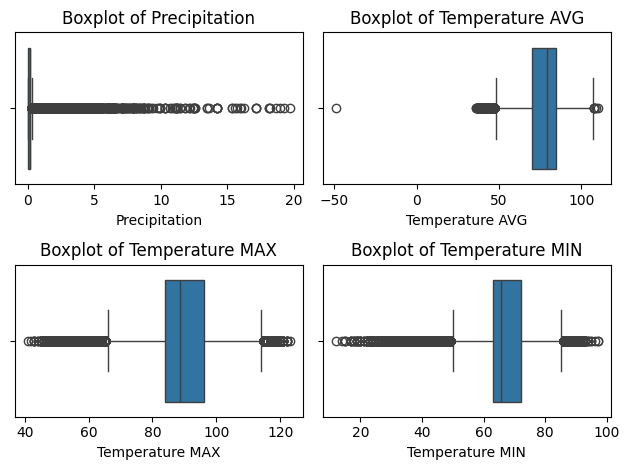

In [36]:
# Checking for outliers
# USING THE BOXPLOT METHOD
import seaborn as sns
import matplotlib.pyplot as plt

numeric_columns = new_data.select_dtypes(include=['float64', 'int64']).columns
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=new_data[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.tight_layout()
plt.show()



- The boxplots shows that there some outliers in the dataset
- In dealing with these outliers i decided to retain them  since dropping them could significantly impact on the results during analysis

In [37]:
# Normalization of the data set(it will be using in machine learning algorithms)

from sklearn.preprocessing import StandardScaler
numerical_data = new_data.select_dtypes(include=['float64','int64'])
scaler = StandardScaler()
data_scaled = scaler.fit_transform(numerical_data)
print(data_scaled)


[[-3.97181725e-04 -2.01013163e+00 -2.39807252e+00 -2.30622858e+00]
 [-3.97181725e-04 -2.44680218e+00 -2.91732331e+00 -2.51080522e+00]
 [-4.01695466e-01 -4.38117679e-01 -2.34527522e-01 -6.69615484e-01]
 ...
 [-3.97181725e-04  8.71893949e-01  3.44231988e-04  7.62420977e-01]
 [-4.01695466e-01  4.35223406e-01  4.57806876e-01  1.95220224e-04]
 [-3.97181725e-04  5.22557515e-01  3.44231988e-04  1.95220224e-04]]


# Save the Cleaned Dataset


In [48]:
# Lets save the cleaned dataset
new_data.to_csv('cleaned_data.csv', index=False)

# Exploritory Data Analysis

In [60]:
# Create a pie chart showing every countires average temperature
avg_temp_per_country = new_data.groupby('Country')['Temperature AVG'].mean().reset_index()
# Create a pie chart
fig = px.pie(avg_temp_per_country, names='Country', values='Temperature AVG', title='Average Temperature per Country')
fig.update_traces(textposition="inside", textinfo="percent+label")
fig.show()

<ipython-input-60-4d5d3c856f91>:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [39]:
# Plot a line chart to show the average temperature fluctuations in Tunisia and Cameroon. Interpret the results.
import plotly.express as px
# filter countries
data_tunisia_cameroon = new_data[new_data['Country'].isin(['Tunisia', 'Cameroon'])]

# Extract year from the DATE column
data_tunisia_cameroon['Year'] = data_tunisia_cameroon['Date'].dt.year

# Calculate the average temperature per year for each country
avg_temp_per_year_country = data_tunisia_cameroon.groupby(['Year', 'Country'])['Temperature AVG'].mean().reset_index()
avg_temp_per_year_country.columns = ['Year', 'Country', 'Temperature AVG']

# Create a line chart
fig = px.line(avg_temp_per_year_country, x='Year', y='Temperature AVG', color='Country', title='Average Temperature in Tunisia and Cameroon Over Time')

# Show the plot
fig.show()



<ipython-input-39-6e987b125641>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_tunisia_cameroon['Year'] = data_tunisia_cameroon['Date'].dt.year
<ipython-input-39-6e987b125641>:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_temp_per_year_country = data_tunisia_cameroon.groupby(['Year', 'Country'])['Temperature AVG'].mean().reset_index()


In [45]:
# Zoom in to only include data between 1980 and 2005, try to customize the axes labels
import plotly.express as px

# Filter countries
countries = ['Tunisia', 'Cameroon']
data_tunisia_cameroon = new_data[(new_data['Country'].isin(countries)) & (new_data['Date'].dt.year.between(1980, 2005))]

# Extract year from the DATE column
data_tunisia_cameroon['Year'] = data_tunisia_cameroon['Date'].dt.year

# Calculate the average temperature per year for each country
avg_temp_per_year_country = data_tunisia_cameroon.groupby(['Year', 'Country'])['Temperature AVG'].mean().reset_index()
avg_temp_per_year_country.columns = ['Year', 'Country', 'Temperature AVG']

# Create a line chart
fig = px.line(avg_temp_per_year_country, x='Year', y='Temperature AVG', color='Country', title='Average Temperature in Tunisia and Cameroon (1980-2005) Over Time')

# Customize axes labels
fig.update_layout(xaxis_title='Year',yaxis_title='Temperature AVG')
fig.show()

<ipython-input-45-6ec8c8b26fbb>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-6ec8c8b26fbb>:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



###  Average Temperature in Tunisia and Cameroon Observations :

1. **Cameroon Shows Higher Average Temperatures**

   * Cameroon (red line) consistently has **higher average temperatures**, mostly ranging between **78°F to 83°F**.
   * Tunisia (orange line) maintains a lower temperature range between **65°F and 70°F**.

2. **Upward Temperature Trend**

   * **Both countries show a general upward trend** in temperature over the 25-year span, supporting the broader narrative of climate change.
   * This is particularly visible in the **early 2000s**, where Cameroon’s temperature climbs sharply.

3. **Year-to-Year Variability**

   * Both lines exhibit **short-term fluctuations**, especially noticeable in Cameroon around **1991**, which shows a sharp peak followed by a drop.
   * This could be due to **data anomalies**, extreme weather events, or sampling irregularities.

4. **Tunisia Shows a Smoother Pattern**

   * Compared to Cameroon, Tunisia’s temperature changes appear **more gradual** and less volatile, which might suggest more stable climate behavior or more consistent data reporting.






### Include all five countries to make comparisons

In [47]:
import plotly.express as px

# List of all five countries
countries = ['Tunisia', 'Cameroon', 'Angola', 'Egypt', 'Senegal']

# Filter data for selected countries and years
filtered_data = new_data[
    (new_data['Country'].isin(countries)) &
    (new_data['Date'].dt.year.between(1980, 2005))
].copy()

# Extract year from Date
filtered_data['Year'] = filtered_data['Date'].dt.year

# Group by Year and Country to calculate average temperature
avg_temp = (
    filtered_data
    .groupby(['Year', 'Country'])['Temperature AVG']
    .mean()
    .reset_index()
)

# Plot all countries on one line chart
fig = px.line(
    avg_temp,
    x='Year',
    y='Temperature AVG',
    color='Country',
    title='Average Temperature in 5 African Countries (1980–2005)'
)

# Customize axes
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Avg Temperature (°F)',
    legend_title='Country',
    height=500
)

fig.show()


<ipython-input-47-c6fb582672bd>:18: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.





### Observations by Country :

#### 1. **Senegal (Purple Line)**

* **Highest average temperatures** overall, mostly above **82°F**, peaking near **84°F** around the late 1990s.
* Shows a **steady increasing trend**, indicating consistent warming.
* **Very little fluctuation**, suggesting stable climate reporting or less seasonal variance.

#### 2. **Cameroon (Red Line)**

* Second highest in average temperature.
* Noticeable **spike in 1991**, possibly a climatic anomaly or data inconsistency.
* After the dip post-1991, there is a **gradual warming** trend again, approaching Senegal’s values near 2005.

#### 3. **Angola (Blue Line)**

* Starts around **77°F**, relatively stable until **2000**, then shows some erratic behavior (notably a dip around 2003).
* **Some fluctuations** in the later years may indicate more climate variability or reporting gaps.

#### 4. **Egypt (Green Line)**

* Temperature range lies between **72°F and 75°F**.
* Overall **slight warming trend**, though not as pronounced as in Cameroon or Senegal.
* Periodic peaks suggest **intermittent hotter years** rather than a consistent rise.

#### 5. **Tunisia (Orange Line)**

* **Lowest average temperatures**, mostly between **65°F and 70°F**.
* Fairly stable until the **early 1990s**, followed by a slight **warming trend** till 2000, then dips again.

---

### **Conclusion:**

1. **All countries show a general warming trend** over the 25-year period — a clear sign of climate change impact.
2. **Senegal and Cameroon are warming the fastest**, especially post-1990.
3. **Temperature convergence** occurs near 2005 between Senegal and Cameroon.
4. **Anomalies in Cameroon (1991)** and **Angola (2003)** warrant deeper inspection — possibly due to natural events or data issues.




In [41]:
# Create Histograms to show temperature distribution in Senegal between [1980,2000] and [2000,2023] (in the same figure). Describe the obtained results

# Filter data for Senegal
data_senegal = new_data[new_data['Country'] == 'Senegal']

# Add a column to differentiate the periods
data_senegal['Period'] = pd.cut(data_senegal['Date'].dt.year, bins=[1980, 2000, 2024], labels=['1980-2000', '2000-2023'], right=False)

# Create a single histogram with different colors for each period
fig = px.histogram(data_senegal, x='Temperature AVG', color='Period',nbins=30, title='Temperature Distribution in Senegal (1980-2000 vs 2000-2023)')
fig.show()

<ipython-input-41-2d16bc6e2ef9>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy





### **Shift in Temperature Distribution:**

* The red bars (2000–2023) **skew slightly to the right** compared to the blue bars (1980–2000).
* This suggests that **average temperatures have increased** in the more recent period.

### **Warming Trend:**

* In the earlier period (blue), most temperatures are clustered around **80–83°F**.
* In the recent period (red), the mode shifts slightly upward, and there are **more occurrences of higher temperatures** (e.g., >85°F).

### **Increase in Extreme Temperatures:**

* The red bars extend further into the **higher temperature range** (above 90°F) compared to the blue bars, indicating **more frequent hot days** in the 2000–2023 period.

### **Overall Shape:**

* Both distributions appear roughly **bell-shaped** (normal-like), but the recent period is **slightly flatter and wider**, implying a **broader range of temperatures** and greater variability.

---

### Conclusion:

Senegal has experienced a **warming shift in average temperatures** between the two periods, with **increased frequency of hotter days** in the 21st century — consistent with global climate change trends.




In [49]:
#Select the best chart to show the Average temperature per country
# bar chart will be used since it will show the difference in AVG of the different countries
# group the average temperature by country
avg_temp_per_country = new_data.groupby('Country')['Temperature AVG'].mean().reset_index()
fig = px.bar(avg_temp_per_country, x='Country', y='Temperature AVG', title='Average Temperature per Country')
fig.show()


<ipython-input-49-20e9620cd194>:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### **Average Temperature Ranking**:

1. **Senegal** has the **highest average temperature** (\~83°F).
2. **Cameroon** follows closely (\~80°F).
3. **Angola** comes next (\~76°F).
4. **Egypt** has a slightly lower average (\~74°F).
5. **Tunisia** has the **lowest average temperature** (\~68°F).

---

### **Key Insights**:

* **Geographical Influence**:

  * Countries closer to the equator (e.g., **Senegal** and **Cameroon**) generally have **higher average temperatures**.
  * **Tunisia**, located further north with more Mediterranean influence, shows **cooler average temperatures**.
* **Climatic Zones**:

  * The data reflects **climatic diversity** across the continent — from **tropical climates** (Cameroon, Angola) to **arid or semi-arid zones** (Egypt, Tunisia).

---

### Conclusion:

Senegal stands out as the warmest among the five countries analyzed, while Tunisia is the coolest. The differences align well with each country's geographic and climatic characteristics.


In [50]:
# Senegal has the highest temperature
# how has the frequency of extreme tempertures changed over the years
data_senegal = new_data[new_data['Country'] == 'Senegal']
#top 5% temperatures
threshold = data_senegal['Temperature AVG'].quantile(0.95)
extreme_events_per_year = data_senegal[data_senegal['Temperature AVG'] > threshold].groupby(data_senegal['Date'].dt.year).size().reset_index(name='Extreme_Events')
extreme_events_per_year.columns = ['Year', 'Extreme_Events']
#line chart
fig = px.line(extreme_events_per_year, x='Year', y='Extreme_Events', title='Frequency of Extreme Temperature Events in Senegal Over the Years')
fig.show()

### Frequency of Extreme Temperature Events in Senegal:


1. **Big Year-to-Year Changes**
   The number of extreme temperature events goes up and down a lot from one year to the next. Some years have a big spike, while others drop sharply.

2. **No Clear Trend**
   There isn’t a smooth increase or decrease over time. The changes are irregular, making it hard to spot a steady pattern.

3. **Years with Many Events (Peaks)**

   * **1996 and 1998** had the most events — around **240**.
   * Other high points were in **1988, 2017**, and **2021**, with over **200 events** each.

4. **Years with Few Events (Troughs)**

   * The lowest number of events was in **2009**, falling below **80**.
   * Other quiet years were **1982, 1999**, and **2018**.

5. **Possible Long-Term Rise**
   Although the numbers jump around a lot, there seem to be more high-activity years in the **2010s and 2020s** compared to the **1980s**. This could mean events are increasing over time, but it’s not easy to see because of the frequent ups and downs.

6. **No Regular Pattern**
   The highs and lows don’t happen in any consistent cycle. They come at random times, with no obvious rhythm.

---

### Conclusion:

The number of extreme temperature events in Senegal has changed a lot from year to year. While some recent years had more events than earlier years, there’s no clear, steady trend — just lots of sharp rises and falls.




In [53]:
# What is the relationship between average temperature and precipitation rate
#scatter plot
fig= px.scatter(new_data,x='Temperature AVG',y='Precipitation',title='Relationshiop between average temperatureand precipitation rate')
fig.show()



### 🌧️How Temperature Affects Precipitation :


1. **Lots of Dry Days**

   * There are many days with **no precipitation at all**.
   * These dry days happen at **all temperatures**, from about 35°F up to over 100°F.

2. **Rain Likes a Certain Temperature**

   * Most of the **wet days** (where PRCP > 0) happen when the temperature is **between 60°F and 90°F**.
   * **Heavier rain** is most likely when temperatures are **between 75°F and 85°F**.

3. **No Straight-Line Trend**

   * Precipitation doesn’t just go up or down with temperature in a straight line.
   * It shows a **non-linear pattern** — rain is more likely in a middle range, not at the highest or lowest temperatures.

4. **Cold or Hot = Dry**

   * Days that are **very cold** (under 60°F) or **very hot** (above 95°F) mostly have **little or no precipitation**.

5. **Outlier Detected**

   * There’s one unusual point where the temperature is extremely low (around **-45°F**) with almost **no precipitation**. This may be a data entry error.

---

### Conclusion

Rain is **most likely and heaviest** when temperatures are **moderate**, around **75–85°F**.
**Extremely cold or hot days** tend to be **dry**.




### Average Temperature by Year and Country Heatmap

<ipython-input-54-652f28fbc9a1>:10: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



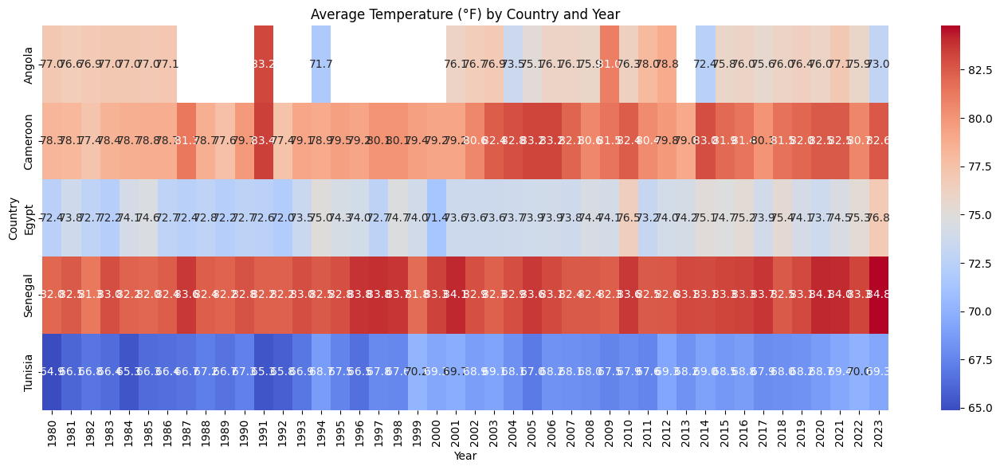

In [54]:
# Plot a heat map of every country
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Ensure year is extracted
new_data['Year'] = new_data['Date'].dt.year

# Pivot for heatmap
heatmap_data = new_data.pivot_table(index='Country', columns='Year', values='Temperature AVG', aggfunc='mean')

# Plot
plt.figure(figsize=(14, 6))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt=".1f")
plt.title('Average Temperature (°F) by Country and Year')
plt.xlabel('Year')
plt.ylabel('Country')
plt.tight_layout()
plt.show()



### Precipitation by Month and Country
This helps you see seasonal rain patterns:

<ipython-input-56-5dda12e0ce5b>:5: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



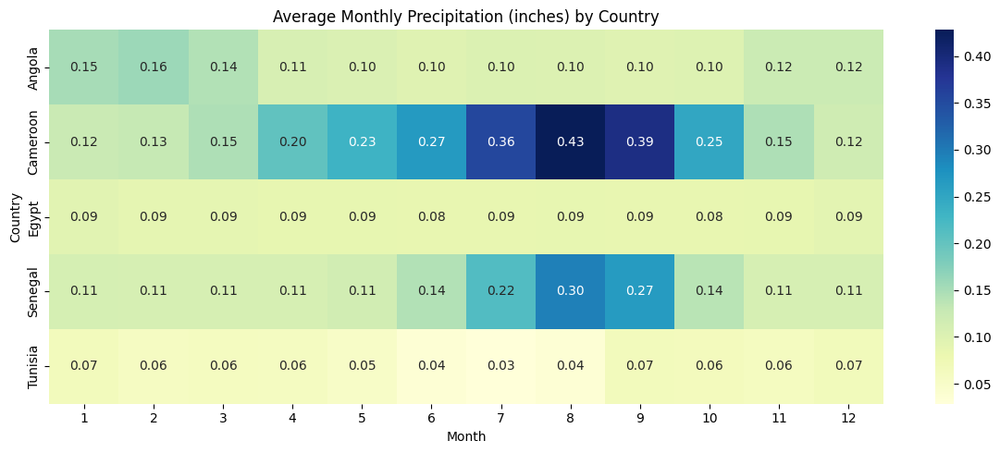

In [56]:

# Extract month
new_data['Month'] = new_data['Date'].dt.month

# Pivot
monthly_prcp = new_data.pivot_table(index='Country', columns='Month', values='Precipitation', aggfunc='mean')

# Plot
plt.figure(figsize=(12, 5))
sns.heatmap(monthly_prcp, cmap='YlGnBu', annot=True, fmt=".2f")
plt.title('Average Monthly Precipitation (inches) by Country')
plt.xlabel('Month')
plt.ylabel('Country')
plt.tight_layout()
plt.show()



### 🌧️ Seasonal Rainfall Patterns Across Five African Countries

#### **Seasonal Trends:**

* **Cameroon**: Has a clear and strong rainy season from **April to September**, peaking in **August** with the highest average rainfall (\~0.43 inches).
* **Senegal**: Also shows a rainy season, mostly between **July and September**, with a peak in **August** (\~0.30 inches), though less intense than Cameroon's.
* **Tunisia**: Opposite trend — it’s driest in **summer (June to August)** and a bit wetter in **winter and spring**.
* **Angola**: Experiences **light rain earlier in the year (January to March)** and a dry period from **May to October**.

#### **Dry Countries:**

* **Egypt**: Has **very low and steady rainfall** all year (around 0.08–0.09 inches per month).
* **Tunisia**: Also quite dry, especially in summer with as little as **0.03–0.04 inches** of rain.

#### **Comparative Summary:**

* **Most Rain**: Cameroon has the **heaviest rainfall**, especially in August.
* **Moderate Rain**: Senegal and Angola fall in the middle—**some seasonality**, but not extreme.
* **Least Rain**: Egypt is the **driest**, followed by Tunisia, with **very little rainfall year-round**.

#### **Rainfall Extremes:**

* **Wettest Month Overall**: **August in Cameroon** (\~0.43 inches).
* **Driest Period**: **June to August in Tunisia** (\~0.03–0.04 inches).

---

### Summary:

The heatmap shows clear climate differences: **Cameroon and Senegal have wet summers**, **Tunisia and Egypt are dry year-round**, and **Angola has light, early-year rainfall**.




### Correlation Heatmap

This will help understand the relationships between numeric variables:

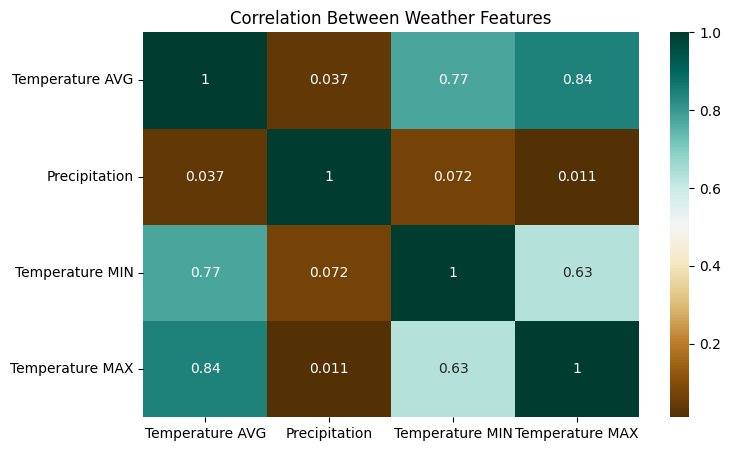

In [58]:
plt.figure(figsize=(8, 5))
sns.heatmap(new_data[['Temperature AVG', 'Precipitation', 'Temperature MIN', 'Temperature MAX']].corr(), annot=True, cmap='BrBG')
plt.title('Correlation Between Weather Features')
plt.show()


**Understanding the Correlation Heatmap**

The heatmap shows how closely different weather variables are related using something called the *Pearson correlation coefficient*. This number goes from -1 to +1:

* **+1** means a perfect positive relationship (they go up and down together).
* **0** means no relationship.
* **-1** means a perfect negative relationship (when one goes up, the other goes down).

The colors in the heatmap show how strong the relationship is:

* **Dark teal** = strong positive relationship
* **Brown/tan** = weak or no relationship

---

**1. Temperature Values Are Strongly Linked:**

* **Average Temperature & Max Temperature**: Strong relationship (0.84). When the average is high, the max is also high.
* **Average Temperature & Min Temperature**: Also strongly linked (0.77). Higher average means higher minimum too.
* **Max Temperature & Min Temperature**: Fairly strong link (0.63), but not as strong as the others.

**2. Precipitation Doesn’t Relate Much to Temperature:**

* All relationships between precipitation and temperatures are very weak (near 0).

  * Precipitation & Average Temp: 0.037
  * Precipitation & Min Temp: 0.072
  * Precipitation & Max Temp: 0.011

This means how much it rains doesn’t really affect the temperature, and knowing the temperature won’t help you guess how much it rained.

---

**Conclusion:**

Temperatures (average, max, and min) tend to rise and fall together. But rainfall is mostly unrelated to any of them.

